# Advanced Optimization Methods

    Having a good optimization algorithm can be the difference between waiting days vs. just a few hours to get a good result

In [3]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import math
import sklearn
import sklearn.datasets

from test_data_generator import *
from opt_utils import *

### 1.) Gradient Descent

In [4]:
# Update Params with Gradient Descent
def update_params_with_gd(params, grads, lr):
    L = len(params) // 2

    for l in range(L):
        params['W' + str(l+1)] = params['W' + str(l+1)] - lr * grads['dW' + str(l+1)]
        params['b' + str(l+1)] = params['b' + str(l+1)] - lr * grads['db' + str(l+1)]
    return params

In [5]:
params, grads, learning_rate = update_parameters_with_gd_test_case()

params = update_params_with_gd(params, grads, learning_rate)
print("W1 =\n" + str(params["W1"]))
print("b1 =\n" + str(params["b1"]))
print("W2 =\n" + str(params["W2"]))
print("b2 =\n" + str(params["b2"]))

W1 =
[[ 1.63535156 -0.62320365 -0.53718766]
 [-1.07799357  0.85639907 -2.29470142]]
b1 =
[[ 1.74604067]
 [-0.75184921]]
W2 =
[[ 0.32171798 -0.25467393  1.46902454]
 [-2.05617317 -0.31554548 -0.3756023 ]
 [ 1.1404819  -1.09976462 -0.1612551 ]]
b2 =
[[-0.88020257]
 [ 0.02561572]
 [ 0.57539477]]


## 2.) Random Mini Batches

In [6]:
# Random mini batches
def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
    np.random.seed(seed)
    m = X.shape[1]
    mini_batches = []

    permutation = list(np.random.permutation(m))
    shuffled_X = X[:, permutation]
    shuffled_Y = Y[:, permutation]
    num_complete_minibatches = math.floor(m/mini_batch_size)
    for k in range(0, num_complete_minibatches):
        mini_batch_X = shuffled_X[:, k*mini_batch_size : (k+1)*mini_batch_size]
        mini_batch_Y = shuffled_Y[:, k*mini_batch_size : (k+1)*mini_batch_size]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)



    if m % mini_batch_size != 0:
        mini_batch_X = shuffled_X[:, int(m / mini_batch_size)*mini_batch_size : ]
        mini_batch_Y = shuffled_Y[:, int(m / mini_batch_size)*mini_batch_size : ]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)

    return mini_batches

In [7]:
X_assess, Y_assess, mini_batch_size = random_mini_batches_test_case()
mini_batches = random_mini_batches(X_assess, Y_assess, mini_batch_size)
print("Minibatches length: ", mini_batches)
print ("shape of the 1st mini_batch_X: " + str(mini_batches[0][0].shape))
print ("shape of the 2nd mini_batch_X: " + str(mini_batches[1][0].shape))
print ("shape of the 3rd mini_batch_X: " + str(mini_batches[2][0].shape))
print ("shape of the 1st mini_batch_Y: " + str(mini_batches[0][1].shape))
print ("shape of the 2nd mini_batch_Y: " + str(mini_batches[1][1].shape)) 
print ("shape of the 3rd mini_batch_Y: " + str(mini_batches[2][1].shape))
print ("mini batch sanity check: " + str(mini_batches[0][0][0][0:3]))

Minibatches length:  [(array([[ 0.90085595, -0.7612069 ,  0.2344157 , ...,  0.12015895,
         0.86888616, -0.60392063],
       [ 2.52832571, -0.10015523, -0.61736206, ...,  0.60231928,
        -0.18657899,  1.39984394],
       [-0.13597733, -0.8805776 , -0.10679399, ..., -0.10999149,
         0.80884436,  0.35016716],
       ...,
       [-0.43984921,  0.28742058, -0.6785365 , ...,  0.76544547,
        -0.71181932,  0.1410268 ],
       [-1.63271355,  0.07176604,  0.34552524, ..., -0.94969794,
        -0.66824325, -1.22559617],
       [-0.12821597,  0.19427479, -1.6059598 , ..., -2.34856141,
        -2.08924821, -0.73948309]]), array([[ True, False,  True,  True,  True, False,  True,  True,  True,
        False,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True, False, False, False,  True,  True,  True,  True,
        False,  True,  True, False,  True,  True,  True,  True,  True,
         True,  True, False,  True, False,  True,  True, False,  True,
        

## 3.) Momentum

In [ ]:
# Initialize velocity vdW and vdb with the same shape as dW and db with np.zeros
def initialize_velocity(params):
    
    L = len(params) // 2
    v = {}

    for l in range(L):
        v['dW' + str(l+1)] = np.zeros((params['W' + str(l+1)].shape[0], params['W' + str(l+1)].shape[1]))
        v['db' + str(l+1)] = np.zeros((params['b' + str(l+1)].shape[0], params['b' + str(l+1)].shape[1]))

    return v

In [11]:
params = initialize_velocity_test_case()

v = initialize_velocity(params)
print("v[\"dW1\"] =\n" + str(v["dW1"]))
print("v[\"db1\"] =\n" + str(v["db1"]))
print("v[\"dW2\"] =\n" + str(v["dW2"]))
print("v[\"db2\"] =\n" + str(v["db2"]))

v["dW1"] =
[[0. 0. 0.]
 [0. 0. 0.]]
v["db1"] =
[[0.]
 [0.]]
v["dW2"] =
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
v["db2"] =
[[0.]
 [0.]
 [0.]]


In [12]:
# Update params with momentum
def update_params_with_momentum(params, grads, v, beta, lr):

    L = len(params) // 2

    for l in range(L):
        # Comput velocity
        v['dW' + str(l+1)] = beta*v['dW' + str(l+1)] + (1 - beta) * grads['dW' + str(l+1)]
        v['db' + str(l+1)] = beta*v['db' + str(l+1)] + (1 - beta) * grads['db' + str(l+1)]
        # Update parameters
        params['W' + str(l+1)] = params['W' + str(l+1)] - lr * v['dW' + str(l+1)]
        params['b' + str(l+1)] = params['b' + str(l+1)] - lr * v['db' + str(l+1)]

    return params, v

In [14]:
params, grads, v = update_parameters_with_momentum_test_case()

params, v = update_params_with_momentum(params, grads, v, beta = 0.9, lr = 0.01)
print("W1 = \n" + str(params["W1"]))
print("b1 = \n" + str(params["b1"]))
print("W2 = \n" + str(params["W2"]))
print("b2 = \n" + str(params["b2"]))
print("v[\"dW1\"] = \n" + str(v["dW1"]))
print("v[\"db1\"] = \n" + str(v["db1"]))
print("v[\"dW2\"] = \n" + str(v["dW2"]))
print("v[\"db2\"] = v" + str(v["db2"]))

W1 = 
[[ 1.62544598 -0.61290114 -0.52907334]
 [-1.07347112  0.86450677 -2.30085497]]
b1 = 
[[ 1.74493465]
 [-0.76027113]]
W2 = 
[[ 0.31930698 -0.24990073  1.4627996 ]
 [-2.05974396 -0.32173003 -0.38320915]
 [ 1.13444069 -1.0998786  -0.1713109 ]]
b2 = 
[[-0.87809283]
 [ 0.04055394]
 [ 0.58207317]]
v["dW1"] = 
[[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]]
v["db1"] = 
[[-0.01228902]
 [-0.09357694]]
v["dW2"] = 
[[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]]
v["db2"] = v[[0.02344157]
 [0.16598022]
 [0.07420442]]


## 4.) Adam

In [15]:
# Initialize Adam
def initialize_adam(params):
    
    L = len(params) // 2
    v = {}
    s = {}
    
    for l in range(L):
        v['dW' + str(l+1)] = np.zeros((params['W' + str(l+1)].shape[0], params['W' + str(l+1)].shape[1]))
        v['db' + str(l+1)] = np.zeros((params['b' + str(l+1)].shape[0], params['b' + str(l+1)].shape[1]))
        s['dW' + str(l+1)] = np.zeros((params['W' + str(l+1)].shape[0], params['W' + str(l+1)].shape[1]))
        s['db' + str(l+1)] = np.zeros((params['b' + str(l+1)].shape[0], params['b' + str(l+1)].shape[1]))

    return v, s

In [16]:
params = initialize_adam_test_case()

v, s = initialize_adam(params)
print("v[\"dW1\"] = \n" + str(v["dW1"]))
print("v[\"db1\"] = \n" + str(v["db1"]))
print("v[\"dW2\"] = \n" + str(v["dW2"]))
print("v[\"db2\"] = \n" + str(v["db2"]))
print("s[\"dW1\"] = \n" + str(s["dW1"]))
print("s[\"db1\"] = \n" + str(s["db1"]))
print("s[\"dW2\"] = \n" + str(s["dW2"]))
print("s[\"db2\"] = \n" + str(s["db2"]))

v["dW1"] = 
[[0. 0. 0.]
 [0. 0. 0.]]
v["db1"] = 
[[0.]
 [0.]]
v["dW2"] = 
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
v["db2"] = 
[[0.]
 [0.]
 [0.]]
s["dW1"] = 
[[0. 0. 0.]
 [0. 0. 0.]]
s["db1"] = 
[[0.]
 [0.]]
s["dW2"] = 
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
s["db2"] = 
[[0.]
 [0.]
 [0.]]


In [21]:
# Update params with adam
def update_params_with_adam(params, grads, v, s, t, lr=0.01, beta1 = 0.9, beta2 = 0.999, epsilon = 1e-8):

    L = len(params) // 2
    v_corrected = {}
    s_corrected = {}

    for l in range(L):
        # Moving average of the gradients. Inputs: v, grads, beta1. Output: v
        v['dW' + str(l+1)] = beta1 * v['dW' + str(l+1)] + (1 - beta1)*grads['dW' + str(l+1)]
        v['db' + str(l+1)] = beta1 * v['db' + str(l+1)] + (1 - beta1)*grads['db' + str(l+1)]
        # Compute bias-corrected first moment estimate. Inputs: v, beta1, t. Output: v_corrected
        v_corrected['dW' + str(l+1)] = v['dW' + str(l+1)] / (1 - beta1**t)
        v_corrected['db' + str(l+1)] = v['db' + str(l+1)] / (1 - beta1**t)

        # Moving average of the squared gradients. Inputs: s, grads, beta2. Output: s
        s['dW' + str(l+1)] = beta2 * s['dW' + str(l+1)] + (1 - beta2) * np.square(grads['dW' + str(l+1)])
        s['db' + str(l+1)] = beta2 * s['db' + str(l+1)] + (1 - beta2) * np.square(grads['db' + str(l+1)])

        # Compute bias-corrected second moment estimate. Inputs: s, beta2, t. Output: s_corrected
        s_corrected['dW' + str(l+1)] = s['dW' + str(l+1)] / (1 - beta2**t)
        s_corrected['db' + str(l+1)] = s['db' + str(l+1)] / (1 - beta2**t)

        # Update params
        params['W' + str(l+1)] = params['W' + str(l+1)] - lr * v_corrected['dW' + str(l+1)] / (np.sqrt(s_corrected['dW' + str(l+1)]) + epsilon)
        params['b' + str(l+1)] = params['b' + str(l+1)] - lr * v_corrected['db' + str(l+1)] / (np.sqrt(s_corrected['db' + str(l+1)]) + epsilon)

    return params, v, s

In [22]:
params, grads, v, s = update_parameters_with_adam_test_case()
params, v, s  = update_params_with_adam(params, grads, v, s, t = 2)

print("W1 = \n" + str(params["W1"]))
print("b1 = \n" + str(params["b1"]))
print("W2 = \n" + str(params["W2"]))
print("b2 = \n" + str(params["b2"]))
print("v[\"dW1\"] = \n" + str(v["dW1"]))
print("v[\"db1\"] = \n" + str(v["db1"]))
print("v[\"dW2\"] = \n" + str(v["dW2"]))
print("v[\"db2\"] = \n" + str(v["db2"]))
print("s[\"dW1\"] = \n" + str(s["dW1"]))
print("s[\"db1\"] = \n" + str(s["db1"]))
print("s[\"dW2\"] = \n" + str(s["dW2"]))
print("s[\"db2\"] = \n" + str(s["db2"]))

W1 = 
[[ 1.63178673 -0.61919778 -0.53561312]
 [-1.08040999  0.85796626 -2.29409733]]
b1 = 
[[ 1.75225313]
 [-0.75376553]]
W2 = 
[[ 0.32648046 -0.25681174  1.46954931]
 [-2.05269934 -0.31497584 -0.37661299]
 [ 1.14121081 -1.09244991 -0.16498684]]
b2 = 
[[-0.88529979]
 [ 0.03477238]
 [ 0.57537385]]
v["dW1"] = 
[[-0.11006192  0.11447237  0.09015907]
 [ 0.05024943  0.09008559 -0.06837279]]
v["db1"] = 
[[-0.01228902]
 [-0.09357694]]
v["dW2"] = 
[[-0.02678881  0.05303555 -0.06916608]
 [-0.03967535 -0.06871727 -0.08452056]
 [-0.06712461 -0.00126646 -0.11173103]]
v["db2"] = 
[[0.02344157]
 [0.16598022]
 [0.07420442]]
s["dW1"] = 
[[0.00121136 0.00131039 0.00081287]
 [0.0002525  0.00081154 0.00046748]]
s["db1"] = 
[[1.51020075e-05]
 [8.75664434e-04]]
s["dW2"] = 
[[7.17640232e-05 2.81276921e-04 4.78394595e-04]
 [1.57413361e-04 4.72206320e-04 7.14372576e-04]
 [4.50571368e-04 1.60392066e-07 1.24838242e-03]]
s["db2"] = 
[[5.49507194e-05]
 [2.75494327e-03]
 [5.50629536e-04]]


## Model to test all 3 optimization algorithms

In [23]:
# NN_model
def NN_model(X, Y, layers_dims, optimizer, lr = 0.0007, mini_batch_size = 64, beta = 0.9, beta1 = 0.9, beta2 = 0.999, epsilon = 1e-8, num_epoches = 10000, pc = True):

    L = len(layers_dims)
    costs = []
    t = 0
    seed = 10
    m = X.shape[1]
    print('Total traning examples: ', m)
    print('Mini batch size: ', mini_batch_size)

    # Initialize params
    # Default initialization is for gradient descent
    params = initialize_parameters(layers_dims)
    if optimizer == 'momentum':
        v = initialize_velocity(params)
    elif optimizer == 'adam':
        v, s = initialize_adam(params)

    # Optimization Loop
    for i in range(num_epoches):

        seed = seed + 1
        mini_batches = random_mini_batches(X, Y, mini_batch_size, seed)
        cost_total = 0
        
        for mini_batch in mini_batches:

            # Select minibatch
            (mini_batch_X, mini_batch_Y) = mini_batch

            # Forward propogation
            a3, catches = forward_propagation(mini_batch_X, params)

            # Compute Cost for the mini_batch and add to the cost total
            cost_total += compute_cost(a3, mini_batch_Y)
            print("\n OK OK \n")
            print(mini_batch_Y)
            print("\n OK OK \n")

            # Backward propogation
            grads = backward_propagation(mini_batch_X, mini_batch_Y, catches)

            # Update params
            if optimizer == 'gd':
                params = update_params_with_gd(params, grads, lr)
            elif optimizer == 'momentum':
                params, v = update_params_with_momentum(params, grads, v, beta, lr)
            elif optimizer == 'adam':
                t = t+1 # Adam counter
                params, v, s = update_params_with_adam(params, grads, v, s, t, lr, beta1, beta2, epsilon)

        cost_avg = cost_total / m

        # Print cost every 1000 epoch
        if pc and i % 1000 == 0:
            print('Cost after epoch %i: %f' %(i, cost_avg))
        if pc and i % 100 == 0:
            costs.append(cost_avg)
    
    # Plot the cost
    plt.plot(costs)
    plt.ylabel('cost')
    plt.xlabel('epochs (per 100)')
    plt.title("Learning rate = " + str(learning_rate))
    plt.show()

    return params   

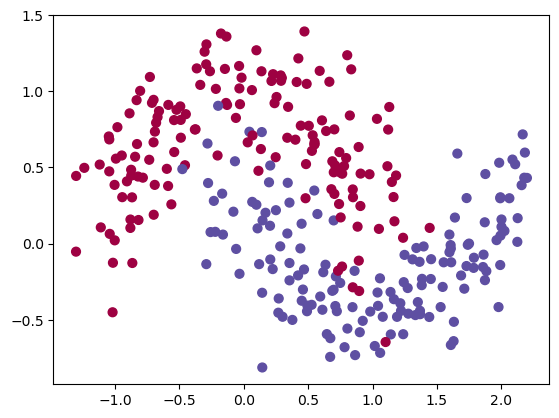

In [24]:
# Load Dataset
train_X, train_Y = load_dataset()

Total traning examples:  300
Mini batch size:  64

 OK OK 

[[1 0 1 0 1 1 0 0 1 0 1 1 0 0 1 1 1 0 0 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 1
  1 1 0 1 0 1 1 1 1 0 1 0 1 0 1 0 1 1 0 0 1 1 1 0 1 0 1 1]]

 OK OK 


 OK OK 

[[0 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 1 0 1 1 0 0 0 0 0 0 0 1 1 1 1 0 1 1 0
  1 0 0 0 0 1 1 1 0 1 1 1 0 0 0 1 1 0 1 1 0 0 1 0 1 1 0 0]]

 OK OK 


 OK OK 

[[0 0 0 0 1 0 1 1 1 0 1 0 0 1 1 0 1 0 1 1 0 1 1 1 0 1 0 0 0 1 1 1 1 1 1 1
  1 1 0 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 0 0 1 0 0 1 1 1 0 1]]

 OK OK 


 OK OK 

[[1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 0 0 1
  0 1 1 0 0 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1 1 1 0 0 0 0 0]]

 OK OK 


 OK OK 

[[1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0 1 0 1 1 1 1 0 1 1 0
  1 0 0 0 0 0 0 0]]

 OK OK 

Cost after epoch 0: 0.702405

 OK OK 

[[0 0 0 0 1 1 1 0 0 0 1 1 0 1 0 1 1 1 1 1 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 1
  1 0 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 1 0 1 1 1 0]]

 OK OK 


 OK OK 

[[0 0 1 1 0 1 0 0 0 0 1 0 0

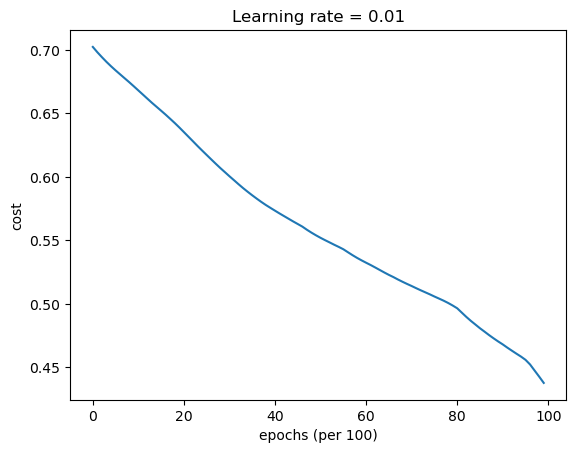

AttributeError: module 'numpy' has no attribute 'int'.
`np.int` was a deprecated alias for the builtin `int`. To avoid this error in existing code, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

In [25]:
# train 3-layer model
layers_dims = [train_X.shape[0], 5, 2, 1]
parameters = NN_model(train_X, train_Y, layers_dims, optimizer = "gd")

# Predict
predictions = predict(train_X, train_Y, parameters)

# Plot decision boundary
plt.title("Model with Gradient Descent optimization")
axes = plt.gca()
axes.set_xlim([-1.5,2.5])
axes.set_ylim([-1,1.5])
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)